<a href="https://colab.research.google.com/github/jacqhorizon/csb410_final/blob/main/notebooks/4_autoencoder_refinement.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# imports

import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow.keras import layers, Model, callbacks
import os
import datetime
import numpy as np
import matplotlib.pyplot as plt

In [2]:
# parameters

AUTOTUNE = tf.data.AUTOTUNE
IMG_SIZE = 256
BATCH_SIZE = 32
MAX_EPOCHS = 30

MODEL_CHECKPOINT_PATH = "models/AE/best_mask_ae_model.keras"
os.makedirs(os.path.dirname(MODEL_CHECKPOINT_PATH), exist_ok=True)

LOG_PATH = "models/AE/logs" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
os.makedirs(os.path.dirname(LOG_PATH), exist_ok=True)

In [3]:
# load the data.

train_data, validation_data = tfds.load(
    "food101",
    split=["train[:90%]", "train[90%:]"],
    as_supervised=False
)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/2 [00:00<?, ? splits/s]

Generating train examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/food101/incomplete.0VGCKD_2.0.0/food101-train.tfrecord*...:   0%|         …

Generating validation examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/food101/incomplete.0VGCKD_2.0.0/food101-validation.tfrecord*...:   0%|    …

Dataset food101 downloaded and prepared to /root/tensorflow_datasets/food101/2.0.0. Subsequent calls will reuse this data.


In [4]:
# create a dummy GAN mask that can later be replaced with the real GAN mask function
# this function will do something basic for now returning some kind of dummy mask and a noisy mask

def create_dummy_mask(image):
  '''
  create a dummy mask for the image
  normally this would be a GAN mask
  this is a placeholder for the GAN mask function created by the GAN team member
  '''
  image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
  image = tf.image.rgb_to_grayscale(image)
  image = tf.cast(image, tf.float32)
  image = image / 255.0

  # this dummy mask will create a mask guessing where food is based on the greyscale value
  mask = tf.where(image >0.5, 1.0, 0.0)

  return mask

def add_noise_to_mask(mask):
  noise = tf.random.uniform(tf.shape(mask), minval=0.0, maxval=1.0)
  # this is creating white and black pixels where the noise values are at their extremes, creating a salt and pepper effect.
  s = tf.cast(noise > 0.7, tf.float32)
  p = tf.cast(noise < 0.3, tf.float32)

  noisy_mask = mask + .35*s - .35*p
  noisy_mask = tf.clip_by_value(noisy_mask, 0.0, 1.0)

  return noisy_mask

def preprocess_placeholder(sample):
  image = sample["image"]
  clean_mask = create_dummy_mask(image)
  noisy_mask = add_noise_to_mask(clean_mask)

  return noisy_mask, clean_mask

In [5]:
train_ae_pipeline = (
    train_data
    .map(preprocess_placeholder, num_parallel_calls=AUTOTUNE)
    .shuffle(1000)
    .batch(BATCH_SIZE)
    .prefetch(AUTOTUNE)
)

validation_ae_pipeline = (
    validation_data
    .map(preprocess_placeholder, num_parallel_calls=AUTOTUNE)
    .batch(BATCH_SIZE)
    .prefetch(AUTOTUNE)
)

In [6]:
# build a convolutional autoencoder for masks
# check model summary to ensure the architecture is correct

def build_mask_autoencoder(input_shape=(IMG_SIZE, IMG_SIZE, 1)):
  # define input layer
  inputs = layers.Input(shape=input_shape)

  # define convolutional encoding layers
  x = layers.Conv2D(32, 3, activation='relu', padding='same', name="conv_1")(inputs)
  x = layers.MaxPooling2D(2, padding='same', name="max_pooling_1")(x)

  x = layers.Conv2D(64, 3, activation='relu', padding='same', name="conv_2")(x)
  x = layers.MaxPooling2D(2, padding='same', name="max_pooling_2")(x)

  x = layers.Conv2D(128, 3, activation='relu', padding='same', name="conv_3")(x)
  x = layers.MaxPooling2D(2, padding='same', name="max_pooling_3")(x)

  bottleneck = layers.Conv2D(256, 3, activation='relu', padding='same', name="bottleneck")(x)

  # define decoding layers - reverse of conv encoding
  x = layers.Conv2DTranspose(128, 3, strides=2, activation="relu", padding="same", name="deconv_1")(bottleneck)
  x = layers.Conv2DTranspose(64, 3, strides=2, activation="relu", padding="same", name="deconv_2")(x)
  x = layers.Conv2DTranspose(32, 3, strides=2, activation="relu", padding="same", name="deconv_3")(x)

  # define output layer and return the model
  output = layers.Conv2D(1, 1, padding="same", activation="sigmoid", name="output")(x)
  return Model(inputs, output, name="mask_autoencoder")

ae_mask_model = build_mask_autoencoder()
ae_mask_model.summary()

Model: "mask_autoencoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 256, 256, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_1 (Conv2D)                 │ (None, 256, 256, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling_1 (MaxPooling2D)    │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_2 (Conv2D)                 │ (None, 128, 128, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling_2 (MaxPooling2D)    │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_3 (Conv2D)                 │ (None, 64, 64, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling_3 (MaxPooling2D)    │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bottleneck (Conv2D)             │ (None, 32, 32, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ deconv_1 (Conv2DTranspose)      │ (None, 64, 64, 128)    │       295,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ deconv_2 (Conv2DTranspose)      │ (None, 128, 128, 64)   │        73,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ deconv_3 (Conv2DTranspose)      │ (None, 256, 256, 32)   │        18,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Conv2D)                 │ (None, 256, 256, 1)    │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 775,169 (2.96 MB)

 Trainable params: 775,169 (2.96 MB)

 Non-trainable params: 0 (0.00 B)

In [7]:
# decide on metrics and loss function for autoencoder training

# since this is a binary mask - food vs non food - binary crossentropy will be the metric to use.
# in my research - the Jaccard index also called Intersection over Union also helps describe how well the model is handling segmentation.
# this helps identify the similarity between two sets or - in our use case - masks.
def jaccard_index(y_true, y_pred, threshold=0.5):
  # find out if the prediction is above or below the threshold
  y_pred_binary = tf.cast(y_pred > threshold, tf.float32)
  intersection = tf.reduce_sum(y_true * y_pred_binary)
  union = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred_binary) - intersection
  # for numeric stability a tiny amount is added to intersection and union to prevent NaNs (0/0)
  return (intersection + 0.000001) / (union + 0.000001)

# to make a custom metric like my jaccard index function with keras compile - we need to create a keras Metric object.
class JaccardIndexMetric(tf.keras.metrics.Metric):
  def __init__(self, threshold=0.5, name='jaccard_index', **kwargs):
    super().__init__(name=name, **kwargs)
    self.total = self.add_weight(name='total', initializer='zeros')
    self.count = self.add_weight(name='count', initializer='zeros')
    self.threshold = threshold

  def update_state(self, y_true, y_pred, sample_weight=None):
    jaccard_idx = jaccard_index(y_true, y_pred, self.threshold)
    self.total.assign_add(jaccard_idx)
    self.count.assign_add(1.0)

  def result(self):
    return self.total / (self.count + 0.000001)

  def reset_states(self):
    self.total.assign(0.0)
    self.count.assign(0.0)

jaccard_idx = JaccardIndexMetric()


# compile model
ae_mask_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss=tf.keras.losses.BinaryCrossentropy(),
    metrics=[jaccard_idx, "accuracy"]
)

In [13]:
%load_ext tensorboard
%tensorboard --logdir models/AE/logs20251216-025608

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [9]:
# fit and validate the autoencoder model
# use early stopping to prevent over training

# using a checkpoint callback in case I need to interrupt training or Colab disconnects
checkpoint = callbacks.ModelCheckpoint(
    filepath=MODEL_CHECKPOINT_PATH,
    monitor="val_loss",
    mode="min",
    save_best_only=True,
    verbose=1
)

# using early stopping to prevent unneccessary training
early_stop = callbacks.EarlyStopping(
  monitor="val_loss",
  mode="min",
  patience=3,
  restore_best_weights=True,
  verbose=1
)

# using tensorboard logging to visualize and log progress
tensorboard = callbacks.TensorBoard(
  log_dir=LOG_PATH,
  histogram_freq=1,
  write_graph=True,
  write_images=False
)

ae_mask_model.fit(
    train_ae_pipeline,
    validation_data=validation_ae_pipeline,
    epochs=MAX_EPOCHS,
    callbacks=[checkpoint, early_stop, tensorboard]
)

Epoch 1/30
2131/2131 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.9501 - jaccard_index: 0.8947 - loss: 0.1270
Epoch 1: val_loss improved from inf to 0.05487, saving model to models/AE/best_mask_ae_model.keras
2131/2131 ━━━━━━━━━━━━━━━━━━━━ 85s 34ms/step - accuracy: 0.9502 - jaccard_index: 0.8947 - loss: 0.1270 - val_accuracy: 0.9772 - val_jaccard_index: 0.9498 - val_loss: 0.0549
Epoch 2/30
2129/2131 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.9787 - jaccard_index: 0.9533 - loss: 0.0511
Epoch 2: val_loss improved from 0.05487 to 0.04340, saving model to models/AE/best_mask_ae_model.keras
2131/2131 ━━━━━━━━━━━━━━━━━━━━ 63s 29ms/step - accuracy: 0.9787 - jaccard_index: 0.9533 - loss: 0.0511 - val_accuracy: 0.9818 - val_jaccard_index: 0.9595 - val_loss: 0.0434
Epoch 3/30
2131/2131 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9830 - jaccard_index: 0.9624 - loss: 0.0407
Epoch 3: val_loss improved from 0.04340 to 0.03464, saving model to models/AE/best_mask_ae_model.keras
2131/2131 

In [10]:
# load best trained model with the jaccard index custom metric
ae_model = tf.keras.models.load_model(
    MODEL_CHECKPOINT_PATH,
    custom_objects={'JaccardIndexMetric': JaccardIndexMetric}
)

In [11]:
def show_masks(noisy, pred, clean, n=5):
    """
    noisy, pred, clean: tensors or arrays of shape (B, H, W, 1)
    """

    noisy = noisy[:n].numpy() if hasattr(noisy, "numpy") else noisy[:n]
    pred  = pred[:n]
    clean = clean[:n].numpy() if hasattr(clean, "numpy") else clean[:n]

    # binarize AE output for visualization
    pred_bin = (pred > 0.5).astype("float32")

    fig, axes = plt.subplots(n, 3, figsize=(9, 3 * n))

    for i in range(n):
        # Noisy input
        axes[i, 0].imshow(noisy[i, ..., 0], cmap="gray")
        axes[i, 0].set_title("Noisy mask")
        axes[i, 0].axis("off")

        # Autoencoder output (binarized)
        axes[i, 1].imshow(pred_bin[i, ..., 0], cmap="gray")
        axes[i, 1].set_title("AE output")
        axes[i, 1].axis("off")

        # Clean target
        axes[i, 2].imshow(clean[i, ..., 0], cmap="gray")
        axes[i, 2].set_title("Clean mask")
        axes[i, 2].axis("off")

    plt.tight_layout()
    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


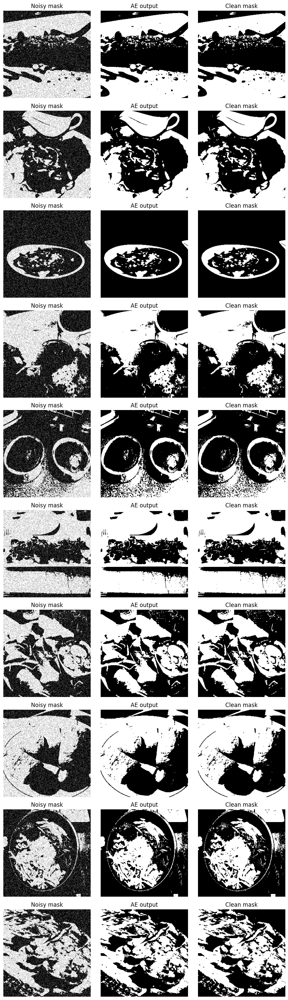

In [12]:
# display the noisy, clean and autoencoded outputs

# unbatch the validation data to shuffle them and pick 10 random samples
sample_small = (
    validation_ae_pipeline
    .unbatch()
    .shuffle(5000)
    .batch(10)
    .take(1)
)

noisy10, clean10 = next(iter(sample_small))
pred10 = ae_model.predict(noisy10)

show_masks(noisy10, pred10, clean10, n=10)